In [9]:
import scipy.io as so
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, StratifiedShuffleSplit
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix
import pandas as pd
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import cv2


In [35]:
mat=so.loadmat('project_data.mat')

In [36]:
x_train=mat['x_train']
x_test=mat['x_test']
y_train=mat['y_train'].flatten()
y_test=mat['y_test'].flatten()

In [39]:
np.bincount(y_test)

array([13, 46, 18, 57, 22, 48, 18, 62, 11, 57, 14, 86, 18, 55, 19, 48, 28,
       59, 24, 72, 17, 53,  6, 14,  8, 55, 12, 53, 24, 54], dtype=int64)

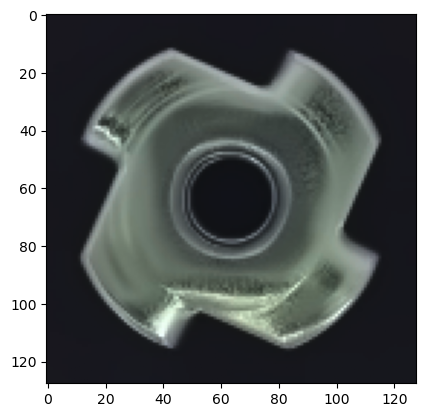

In [5]:
plt.imshow(x_train[0])
plt.show()

In [6]:
def create_model(optimizer='adam', dropout_rate=0.5):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(dropout_rate))
    
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(dropout_rate))
    
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(30, activation='softmax'))
    
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

In [5]:
y_train = to_categorical(y_train, num_classes=30)
y_test = to_categorical(y_test, num_classes=30)

In [ ]:
data_new = StratifiedShuffleSplit(n_splits=1, test_size=0.4, random_state=42)
for train_index, test_index in data_new.split(x_train, y_train):
    x_train_subset, _ = x_train[train_index], x_train[test_index]
    y_train_subset, _ = y_train[train_index], y_train[test_index]

model = KerasClassifier(build_fn=create_model, verbose=0)

param_grid = {
    'batch_size': [16, 32],
    'epochs': [5, 10],
    'optimizer': ['adam', 'rmsprop'],
    'dropout_rate': [0.3, 0.5]
}

random_search = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=10, n_jobs=-1, cv=3)
random_search_result = random_search.fit(x_train_subset, y_train_subset)

print(f"Best parameters: {random_search_result.best_params_}")
print(f"Best score: {random_search_result.best_score_}")

best_model = random_search_result.best_estimator_

C:\Users\Derek Duan\AppData\Local\Temp\ipykernel_7984\3850191519.py:27: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = KerasClassifier(build_fn=create_model, verbose=0)


Best parameters: {'optimizer': 'adam', 'epochs': 10, 'dropout_rate': 0.3, 'batch_size': 16}
Best score: 0.7699497739473978


In [10]:
test_loss, test_accuracy = best_model.model.evaluate(x_test, y_test)
print(f"Test loss: {test_loss}")
print(f"Test accuracy: {test_accuracy}")

34/34 [==============================] - 1s 32ms/step - loss: 0.5980 - accuracy: 0.7703
Test loss: 0.5979644060134888
Test accuracy: 0.7703081369400024


In [12]:
#save architecture and weights
best_model.model.save('best_keras_model.h5')

# Load the Keras model
# from tensorflow.keras.models import load_model
# loaded_keras_model = load_model('best_keras_model.h5')

34/34 [==============================] - 1s 35ms/step


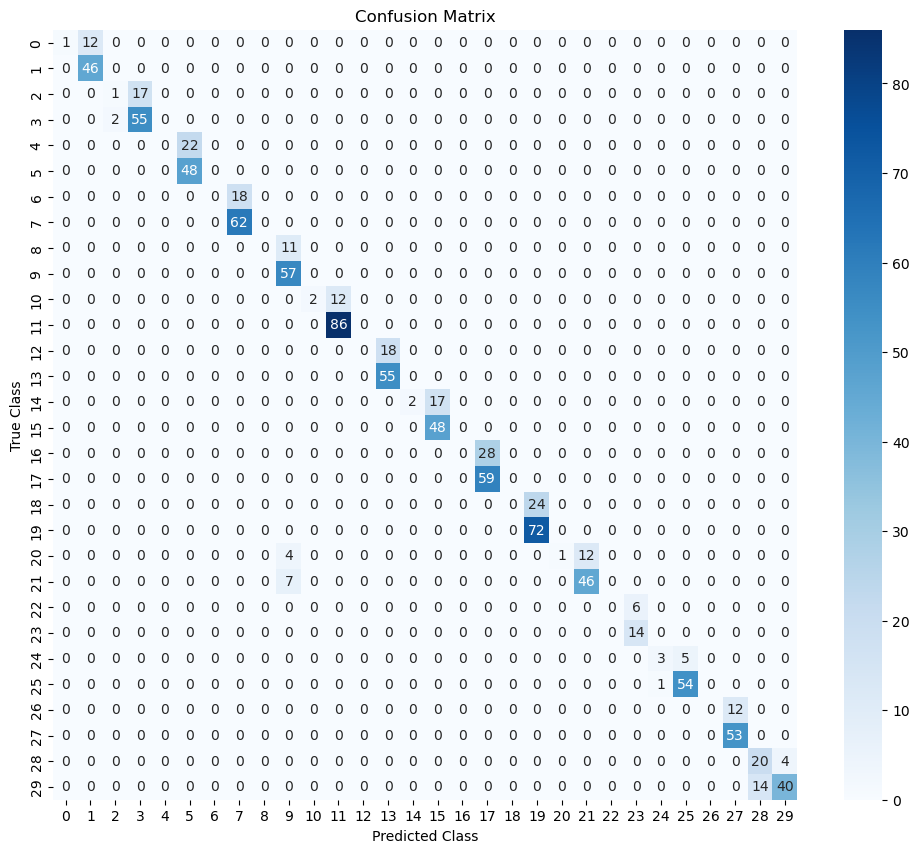

In [14]:
y_pred = best_model.model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)

plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=range(30), yticklabels=range(30))
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.title('Confusion Matrix')
plt.show()


In [18]:
pd.options.display.max_rows=100
report = classification_report(y_true_classes, y_pred_classes, target_names=[f'Class {i}' for i in range(30)],output_dict=True)
report=pd.DataFrame(report).transpose()

c:\Users\Derek Duan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Derek Duan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Derek Duan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [21]:
report

,precision,recall,f1-score,support
Class 0,1.000000,0.076923,0.142857,13.000000
Class 1,0.793103,1.000000,0.884615,46.000000
Class 2,0.333333,0.055556,0.095238,18.000000
Class 3,0.763889,0.964912,0.852713,57.000000
Class 4,0.000000,0.000000,0.000000,22.000000
Class 5,0.685714,1.000000,0.813559,48.000000
Class 6,0.000000,0.000000,0.000000,18.000000
Class 7,0.775000,1.000000,0.873239,62.000000
Class 8,0.000000,0.000000,0.000000,11.000000
Class 9,0.721519,1.000000,0.838235,57.000000


Class 0


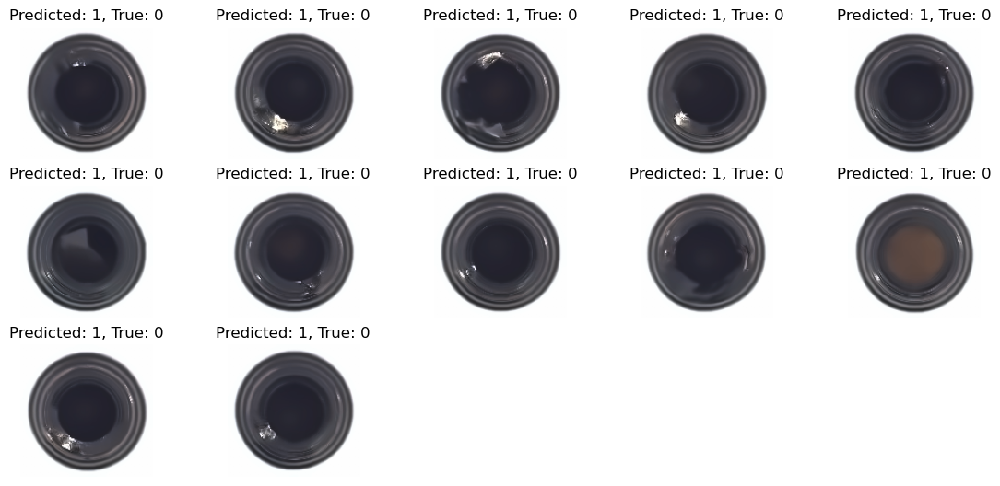

Class 2


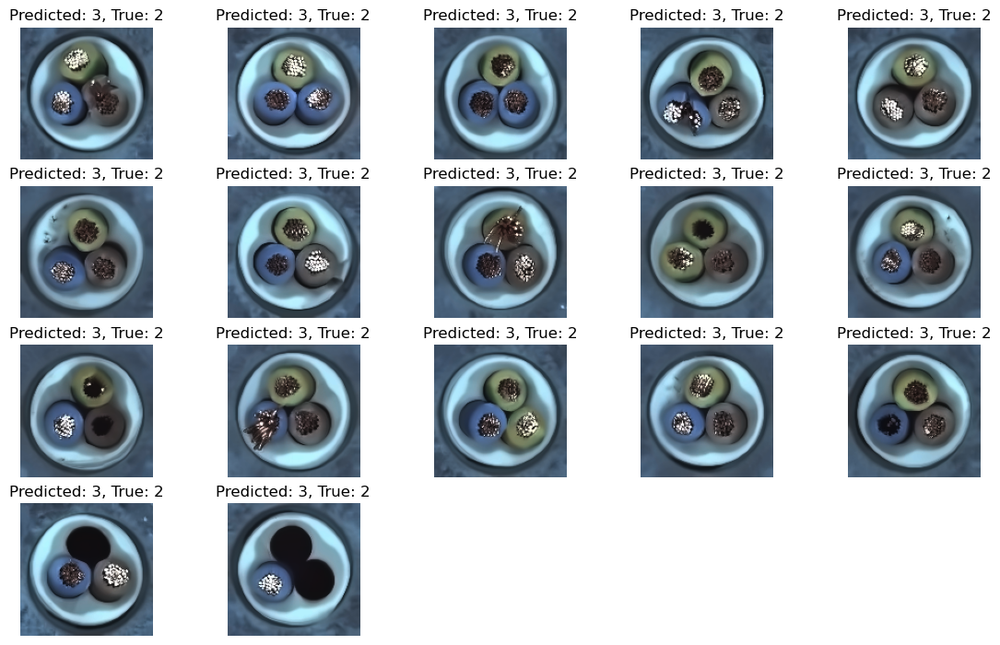

Class 4


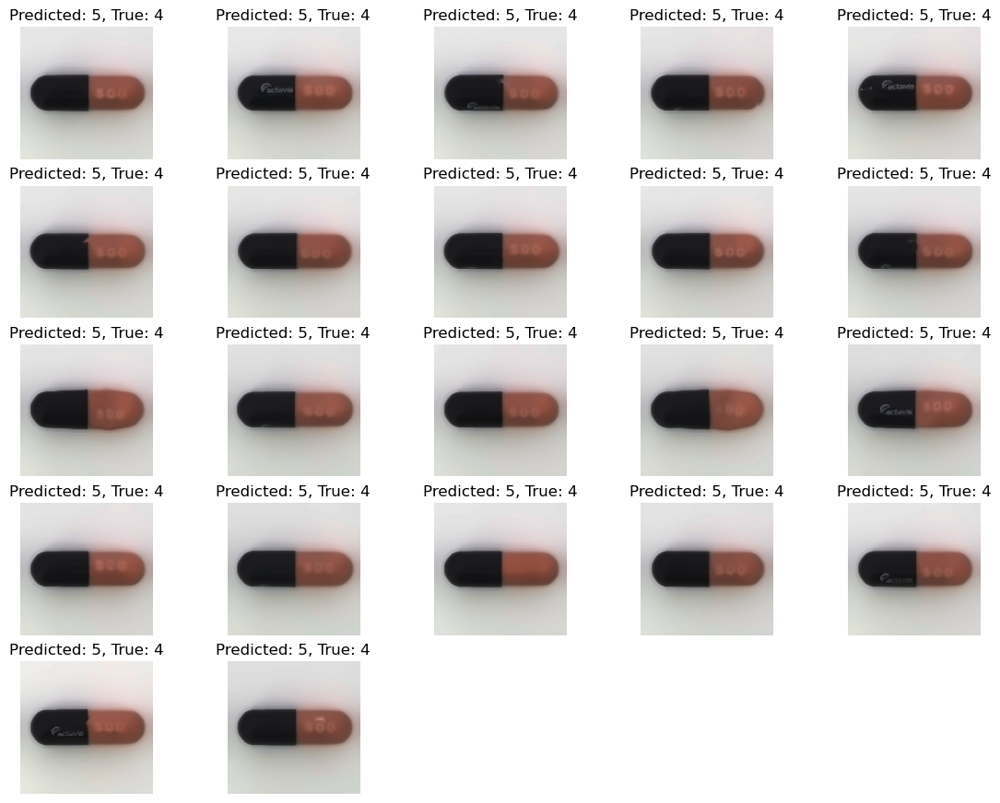

Class 6


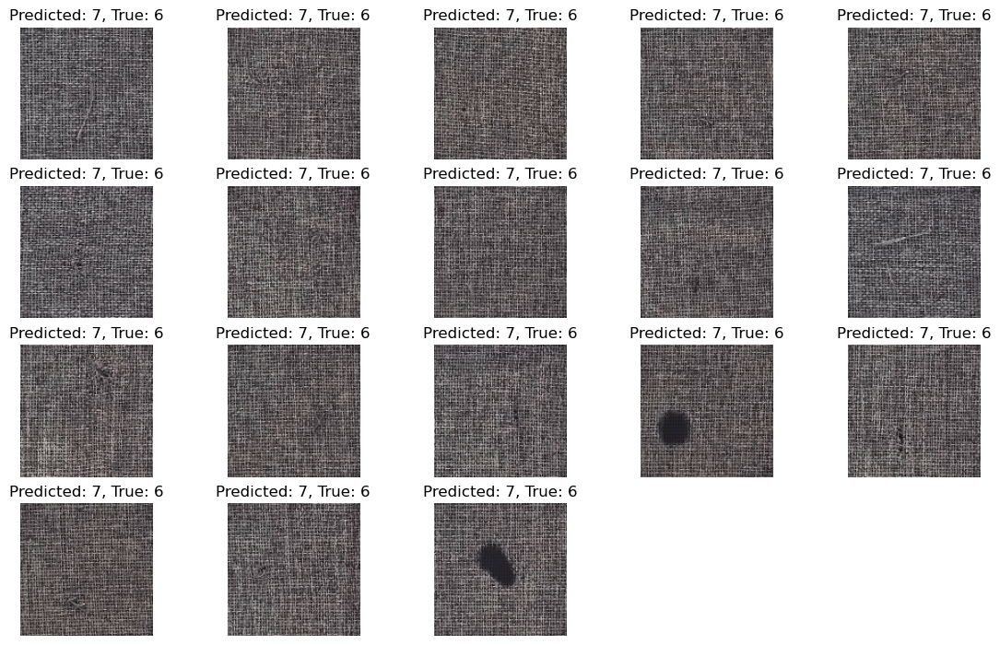

Class 8


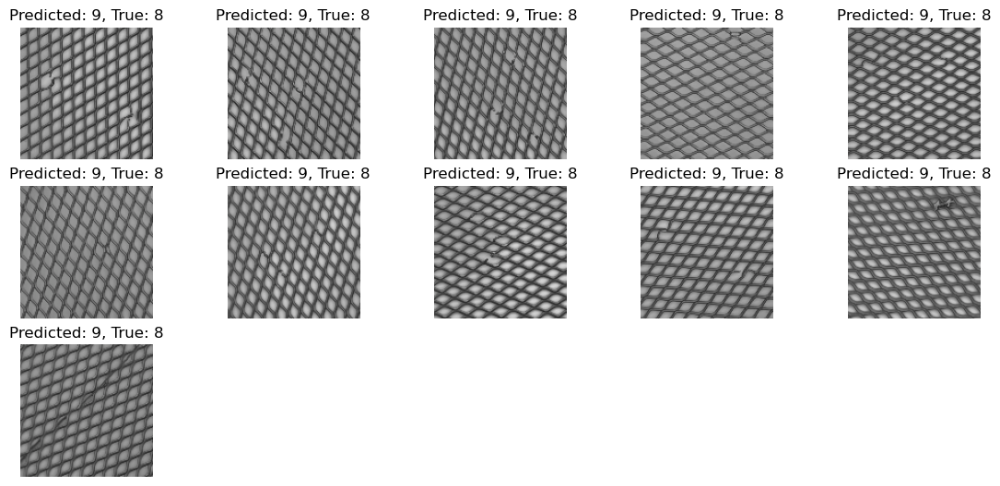

Class 10


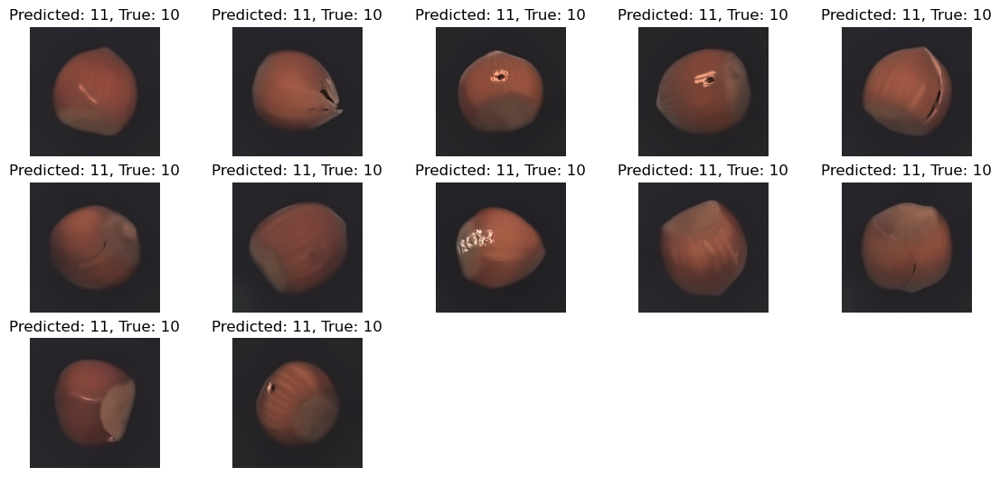

Class 12


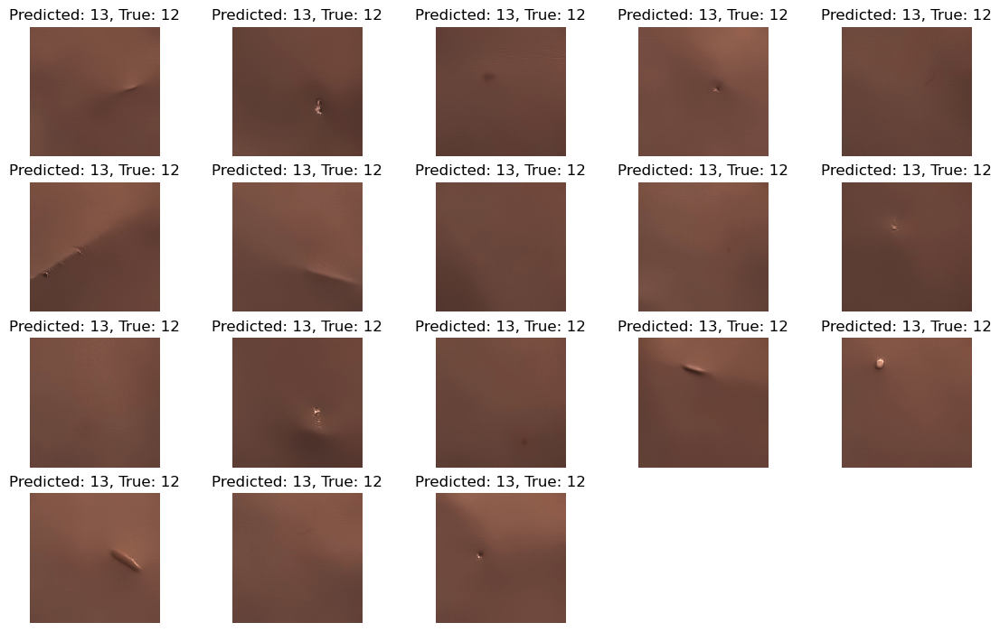

Class 14


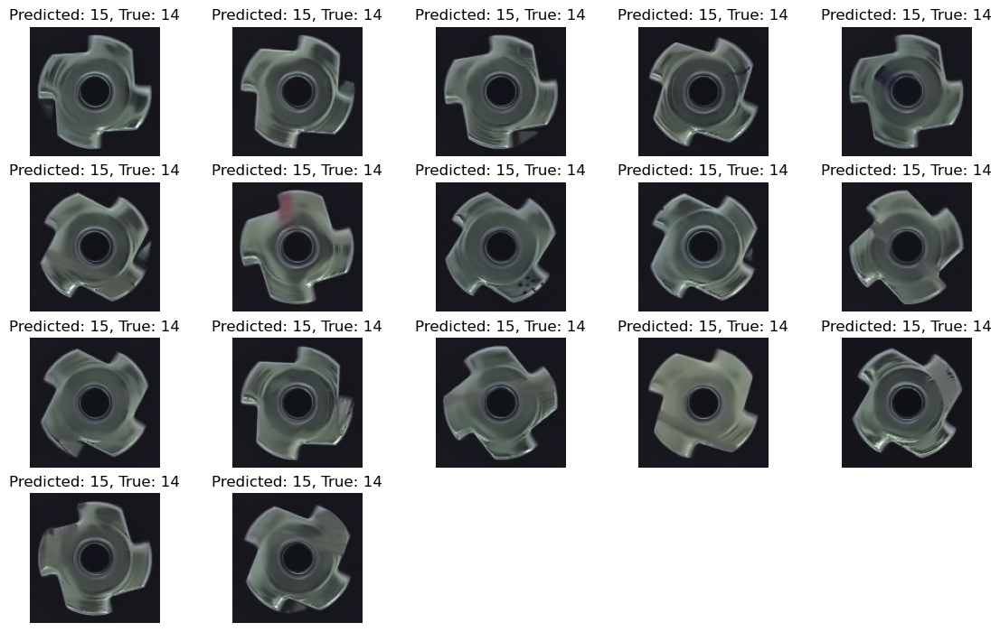

Class 16


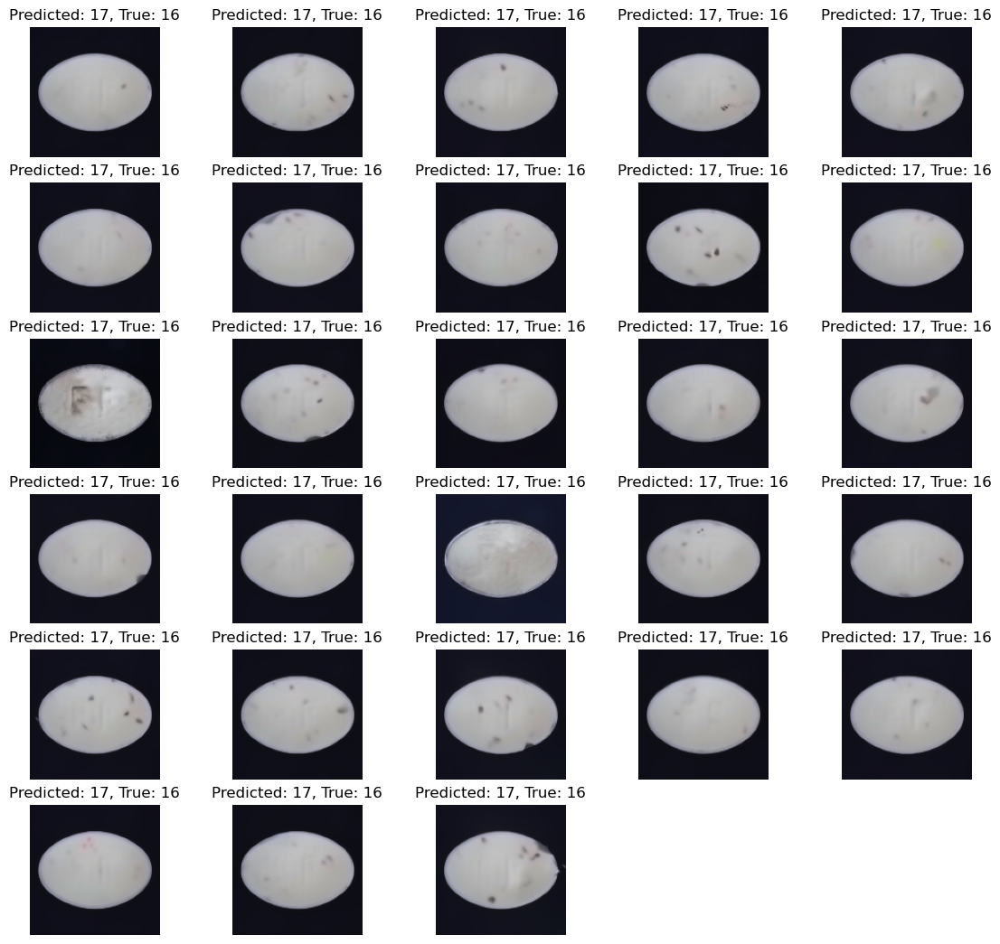

Class 18


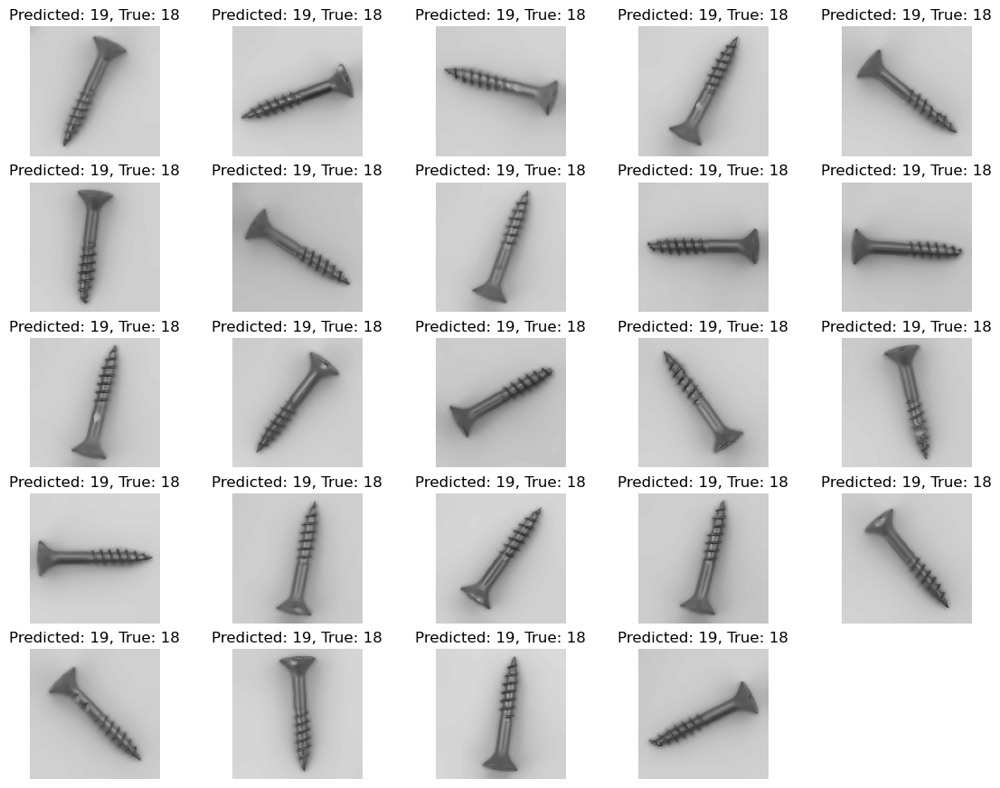

Class 20


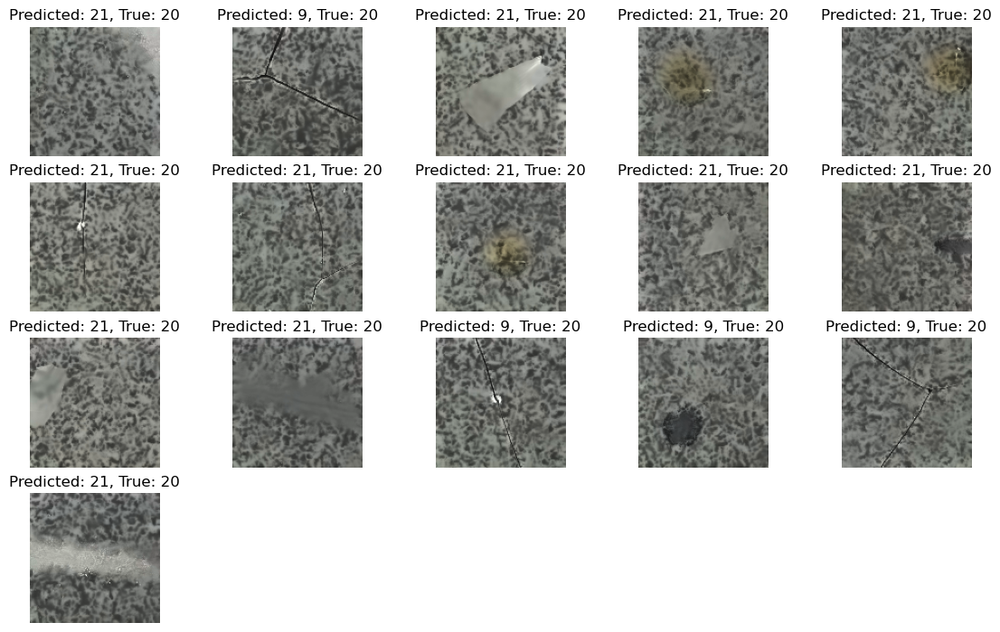

Class 22


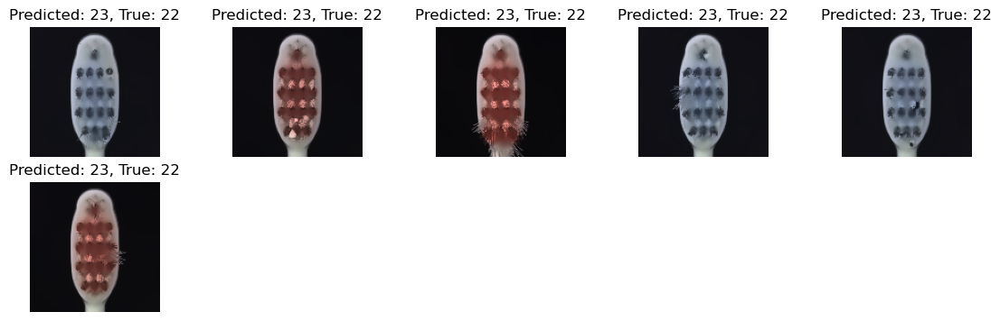

Class 24


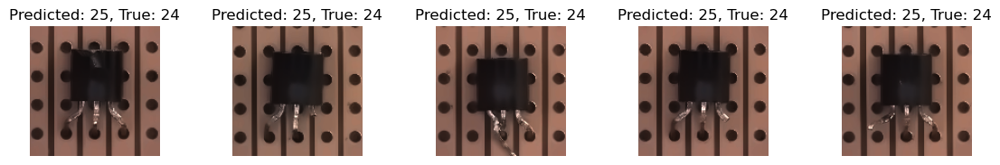

In [38]:
classes=list(report[report['recall']<0.6].index)[:-2]
for i in [int(s.split()[1]) for s in classes]:
    print("Class {}".format(i))
    true_label=i
    misclassified_indices = np.where((y_true_classes == true_label) & (y_pred_classes != true_label))[0]

    # Plot the misclassified images
    plt.figure(figsize=(14,22))
    for i, idx in enumerate(misclassified_indices[:50]):  # Plot up to 50 images
        plt.subplot(10, 5, i + 1)
        plt.imshow(x_test[idx])
        plt.title(f"Predicted: {y_pred_classes[idx]}, True: {y_true_classes[idx]}")
        plt.axis('off')
    plt.show()

With PCA

In [7]:
x_train_flattened = x_train.reshape(x_train.shape[0], -1)
x_test_flattened = x_test.reshape(x_test.shape[0], -1)

pca = PCA(n_components=256) 
x_train_pca = pca.fit_transform(x_train_flattened)
x_test_pca = pca.transform(x_test_flattened)

image_size = 16
x_train_pca_reshaped = x_train_pca.reshape(x_train_pca.shape[0], image_size, image_size, 1)
x_test_pca_reshaped = x_test_pca.reshape(x_test_pca.shape[0], image_size, image_size, 1)

In [34]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(image_size, image_size, 1)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(30, activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.fit(x_train_pca_reshaped, y_train, epochs=10, batch_size=16, validation_data=(x_test_pca_reshaped, y_test))

Epoch 1/10
268/268 [==============================] - 2s 4ms/step - loss: 1.3931 - accuracy: 0.5867 - val_loss: 0.7644 - val_accuracy: 0.7255
Epoch 2/10
268/268 [==============================] - 1s 4ms/step - loss: 0.7987 - accuracy: 0.7025 - val_loss: 0.6560 - val_accuracy: 0.7460
Epoch 3/10
268/268 [==============================] - 1s 4ms/step - loss: 0.7049 - accuracy: 0.7233 - val_loss: 0.6097 - val_accuracy: 0.7507
Epoch 4/10
268/268 [==============================] - 1s 4ms/step - loss: 0.6333 - accuracy: 0.7355 - val_loss: 0.5623 - val_accuracy: 0.7666
Epoch 5/10
268/268 [==============================] - 1s 4ms/step - loss: 0.6009 - accuracy: 0.7469 - val_loss: 0.5599 - val_accuracy: 0.7582
Epoch 6/10
268/268 [==============================] - 1s 4ms/step - loss: 0.5864 - accuracy: 0.7565 - val_loss: 0.5470 - val_accuracy: 0.7666
Epoch 7/10
268/268 [==============================] - 1s 4ms/step - loss: 0.5808 - accuracy: 0.7513 - val_loss: 0.5458 - val_accuracy: 0.7740
Epoch 

34/34 [==============================] - 0s 2ms/step


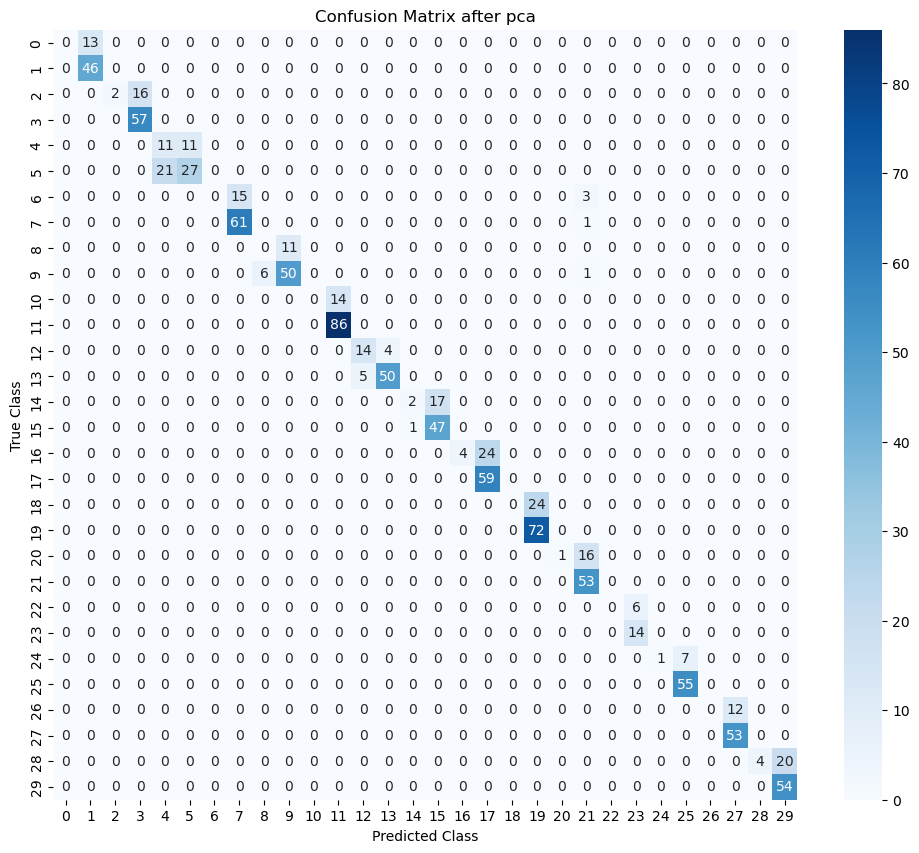

In [35]:
y_pred_pca = model.predict(x_test_pca_reshaped)
y_pred_classes_pca = np.argmax(y_pred_pca, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

conf_matrix = confusion_matrix(y_true_classes, y_pred_classes_pca)

plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=range(30), yticklabels=range(30))
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.title('Confusion Matrix after pca')
plt.show()

In [37]:
report_pca = classification_report(y_true_classes, y_pred_classes_pca, target_names=[f'Class {i}' for i in range(30)],output_dict=True)
report_pca=pd.DataFrame(report_pca).transpose()
report_pca

c:\Users\Derek Duan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Derek Duan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Derek Duan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,precision,recall,f1-score,support
Class 0,0.000000,0.000000,0.000000,13.000000
Class 1,0.779661,1.000000,0.876190,46.000000
Class 2,1.000000,0.111111,0.200000,18.000000
Class 3,0.780822,1.000000,0.876923,57.000000
Class 4,0.343750,0.500000,0.407407,22.000000
Class 5,0.710526,0.562500,0.627907,48.000000
Class 6,0.000000,0.000000,0.000000,18.000000
Class 7,0.802632,0.983871,0.884058,62.000000
Class 8,0.000000,0.000000,0.000000,11.000000
Class 9,0.819672,0.877193,0.847458,57.000000


edge detection

In [10]:
def edge_detection(images, threshold):
    from skimage import filters
    edge_detected_images = []
    for img in images:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        edges = filters.sobel(gray)
        edges = (edges > threshold).astype(int)
        edge_detected_images.append(edges)
    return np.array(edge_detected_images)


x_train_edges = edge_detection(x_train,0.085)
x_test_edges = edge_detection(x_test,0.085)


In [135]:
x_train_flattened.shape

(4283, 49152)

In [125]:
# import cv2

# def apply_edge_detection(images,t1,t2):
#     edge_detected_images = []
#     for img in images:
#         gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
#         edges = cv2.Canny(gray, threshold1=t1, threshold2=t2)
#         edge_detected_images.append(edges)
#     return np.array(edge_detected_images)

# t1=0.01
# t2=0.05

# x_train_edges = apply_edge_detection(x_train,t1,t2)
# x_test_edges = apply_edge_detection(x_test,t1,t2)

# plt.imshow(x_train_edges[10], cmap='gray')

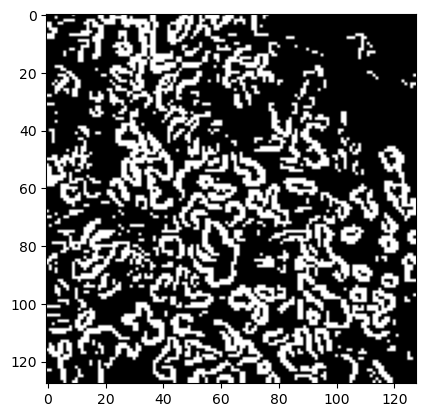

In [137]:
plt.imshow(x_test_edges[29],cmap='gray')

In [22]:
from tensorflow.keras.optimizers import Adam
def create_model(learning_rate=0.001, dropout_rate=0.5):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(image_size, image_size, 1)))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(dropout_rate))
    
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(dropout_rate))
    
    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(30, activation='softmax'))
    
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model


x_train_edges_flattened = x_train_edges.reshape(x_train_edges.shape[0], -1)
x_test_edges_flattened = x_test_edges.reshape(x_test_edges.shape[0], -1)

x_train_combined = np.concatenate((x_train_flattened, x_train_edges_flattened), axis=1)
x_test_combined = np.concatenate((x_test_flattened, x_test_edges_flattened), axis=1)

pca = PCA(n_components=256) 
x_train_pca = pca.fit_transform(x_train_combined)
x_test_pca = pca.transform(x_test_combined)

image_size = 16
x_train_pca_reshaped = x_train_pca.reshape(x_train_pca.shape[0], image_size, image_size, 1)
x_test_pca_reshaped = x_test_pca.reshape(x_test_pca.shape[0], image_size, image_size, 1)

model = KerasClassifier(build_fn=create_model, verbose=0)

C:\Users\Derek Duan\AppData\Local\Temp\ipykernel_22172\2208834002.py:37: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = KerasClassifier(build_fn=create_model, verbose=0)


In [23]:
param_grid = {
    'batch_size': [20,40,60,80],
    'dropout_rate': np.linspace(0.1, 0.8, 5),
    'epochs': np.linspace(5,20,4).astype('int')
}

random_search = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=10, n_jobs=-1, cv=5)
random_search_result = random_search.fit(x_train_pca_reshaped, y_train)

print(f"Best parameters: {random_search_result.best_params_}")
print(f"Best score: {random_search_result.best_score_}")

Best parameters: {'epochs': 15, 'dropout_rate': 0.275, 'batch_size': 60}
Best score: 0.777261471748352


In [26]:
best_model = random_search_result.best_estimator_
test_loss, test_accuracy = best_model.model.evaluate(x_test_pca_reshaped, y_test)

print(f"Test loss: {test_loss}")
print(f"Test accuracy: {test_accuracy}")

34/34 [==============================] - 0s 2ms/step - loss: 0.6835 - accuracy: 0.7386
Test loss: 0.6834738254547119
Test accuracy: 0.7385621070861816


34/34 [==============================] - 0s 2ms/step


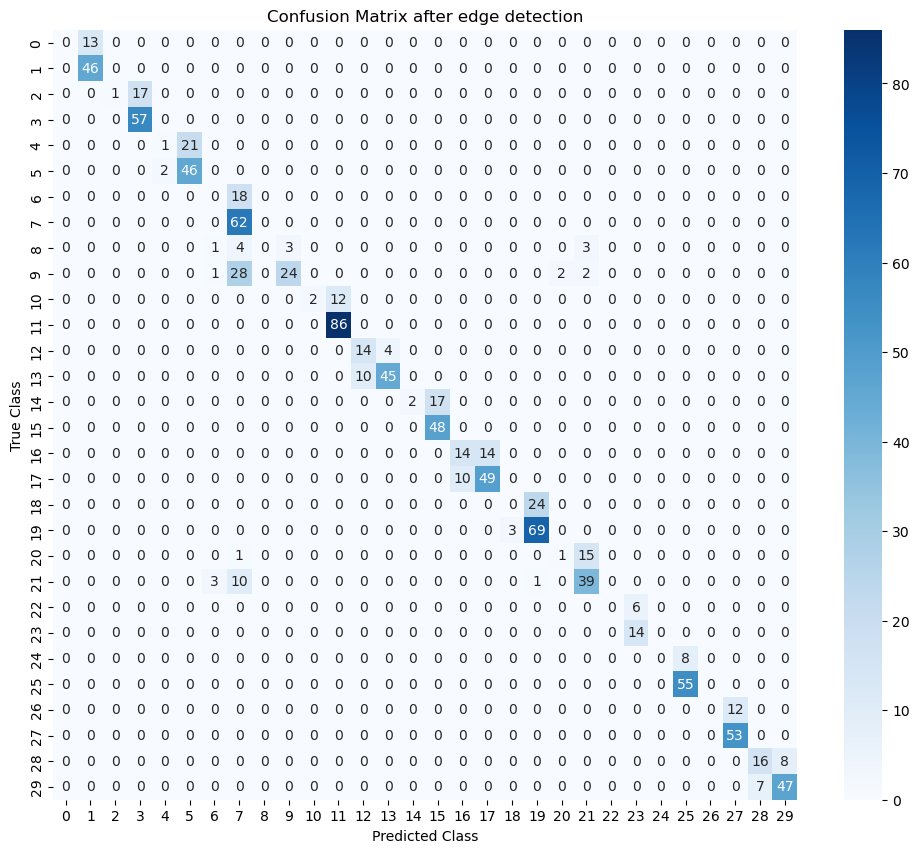

In [28]:
y_pred_edge = best_model.model.predict(x_test_pca_reshaped)
y_pred_classes_edge = np.argmax(y_pred_edge, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

conf_matrix = confusion_matrix(y_true_classes, y_pred_classes_edge)

plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=range(30), yticklabels=range(30))
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.title('Confusion Matrix after edge detection')
plt.show()

In [29]:
report_edge = classification_report(y_true_classes, y_pred_classes_edge, target_names=[f'Class {i}' for i in range(30)],output_dict=True)
report_edge=pd.DataFrame(report_edge).transpose()
report_edge

c:\Users\Derek Duan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Derek Duan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Derek Duan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,precision,recall,f1-score,support
Class 0,0.000000,0.000000,0.000000,13.000000
Class 1,0.779661,1.000000,0.876190,46.000000
Class 2,1.000000,0.055556,0.105263,18.000000
Class 3,0.770270,1.000000,0.870229,57.000000
Class 4,0.333333,0.045455,0.080000,22.000000
Class 5,0.686567,0.958333,0.800000,48.000000
Class 6,0.000000,0.000000,0.000000,18.000000
Class 7,0.504065,1.000000,0.670270,62.000000
Class 8,0.000000,0.000000,0.000000,11.000000
Class 9,0.888889,0.421053,0.571429,57.000000


Class 0


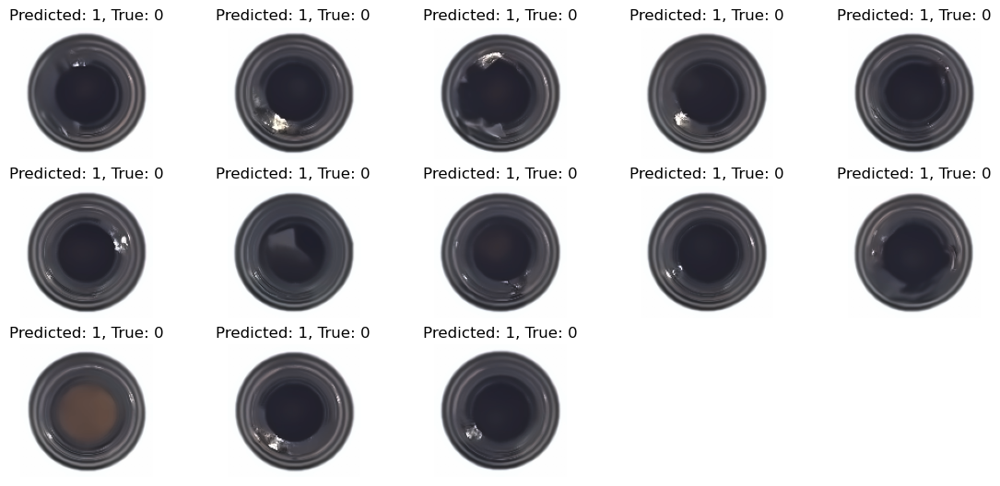

Class 2


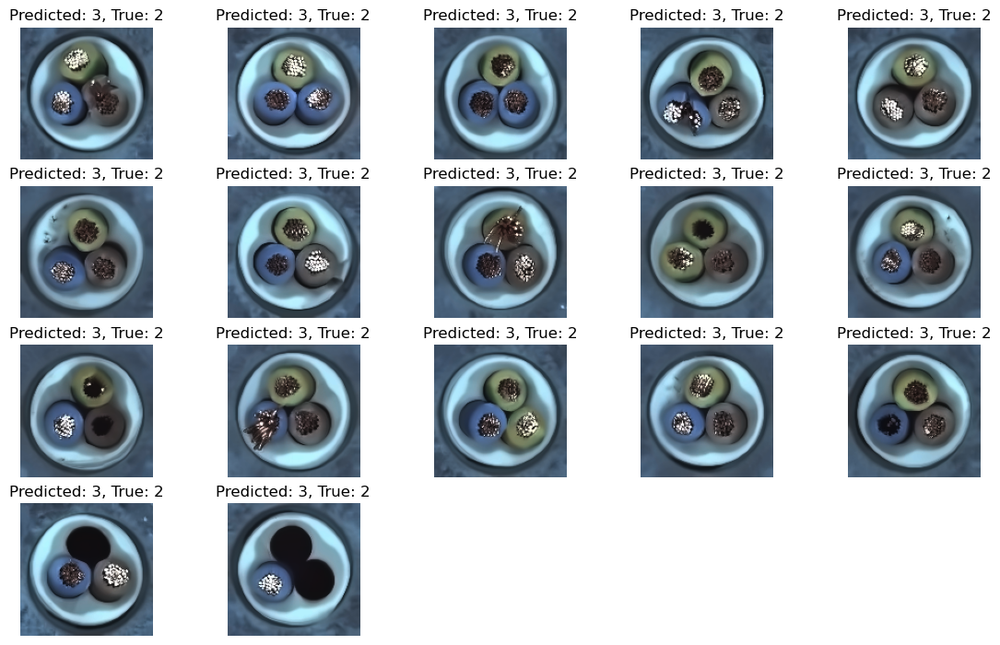

Class 4


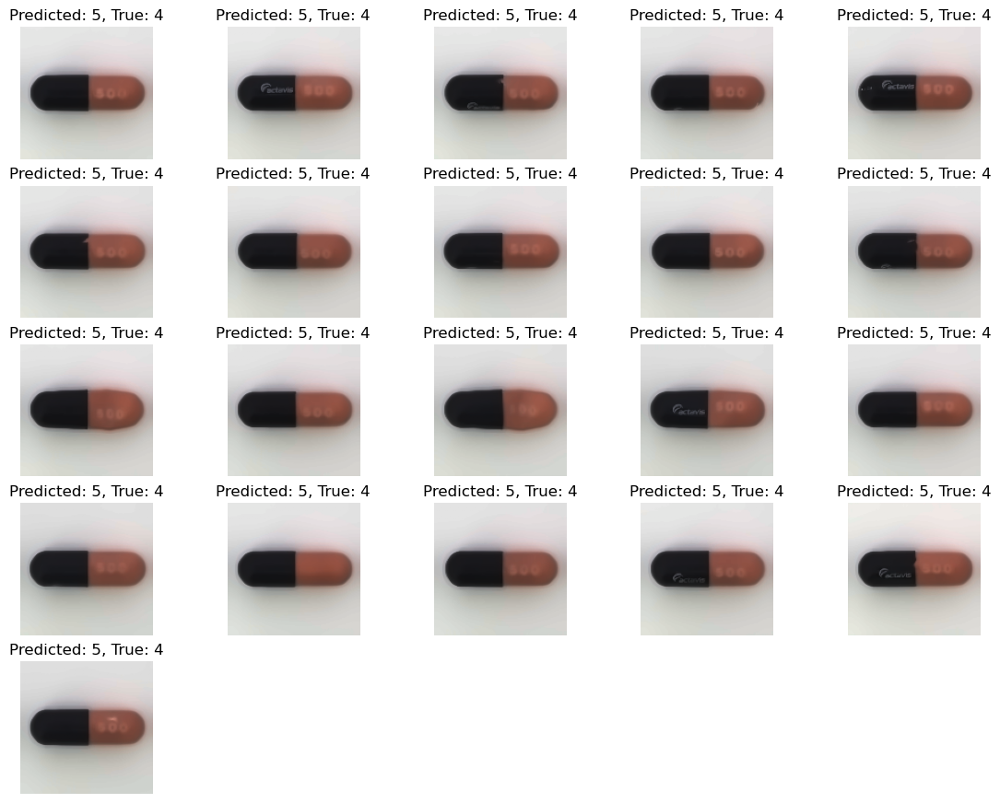

Class 6


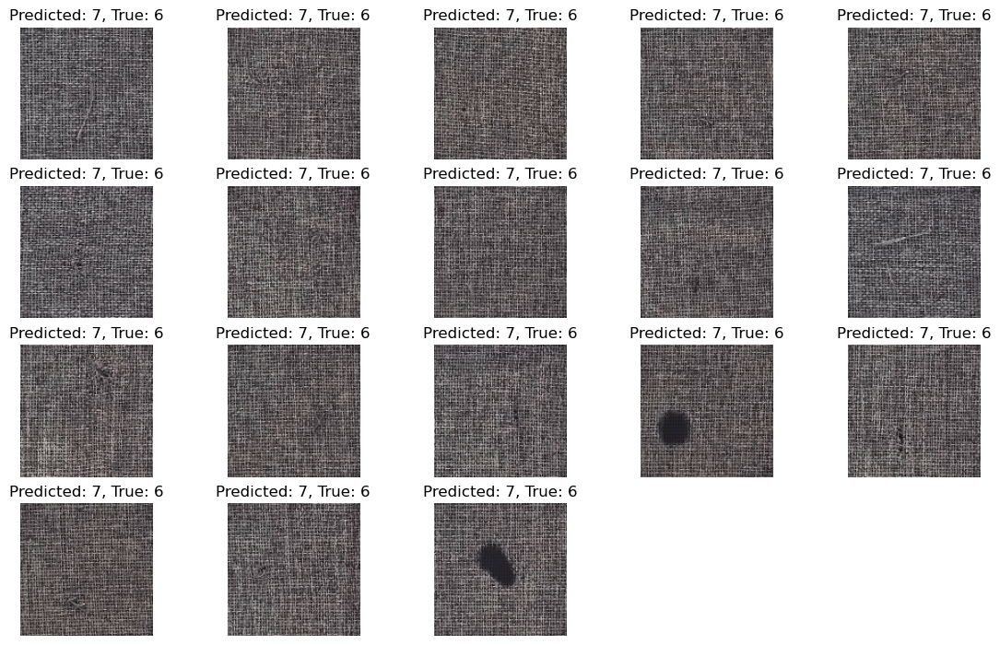

Class 8


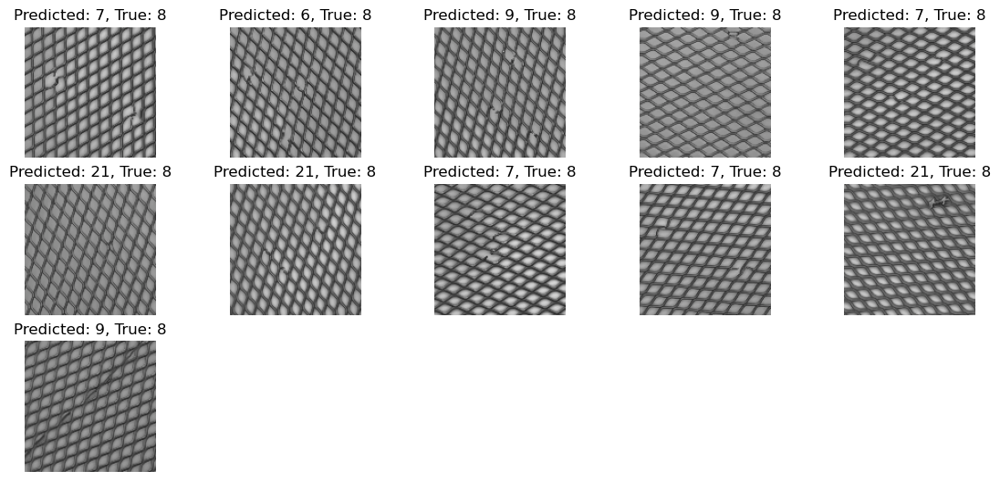

Class 9


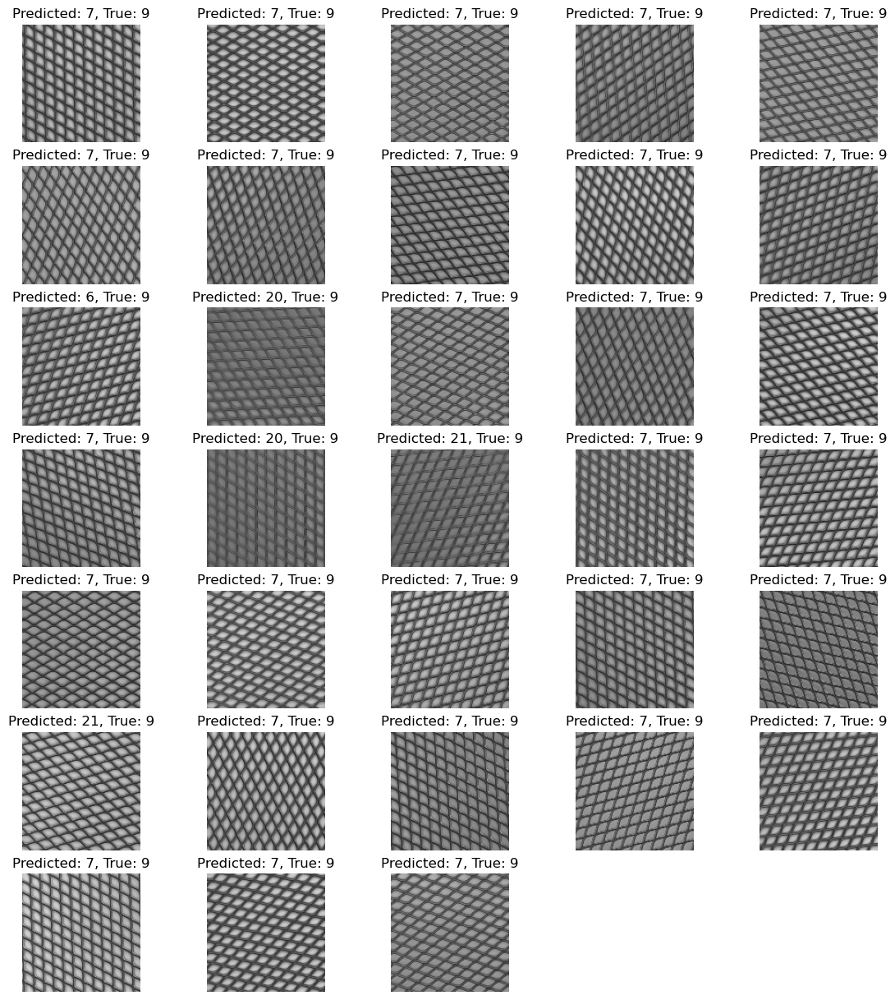

Class 10


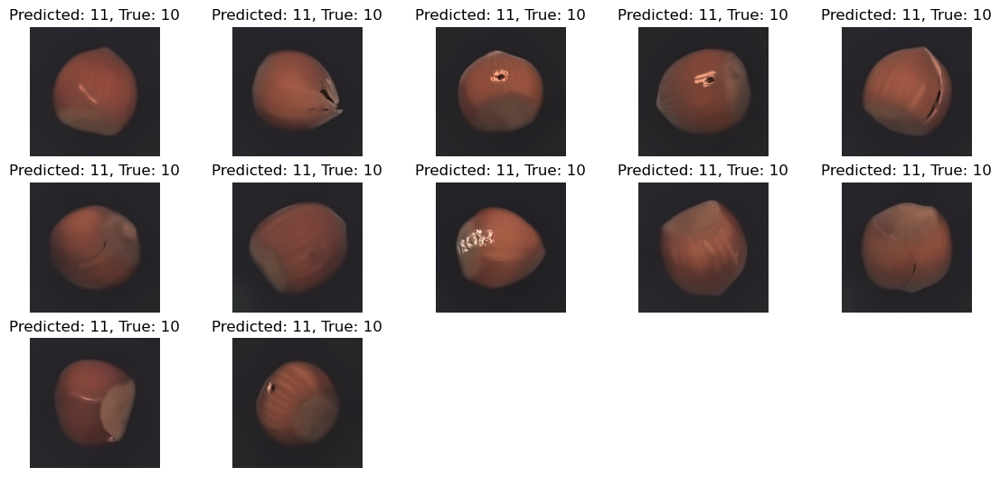

Class 14


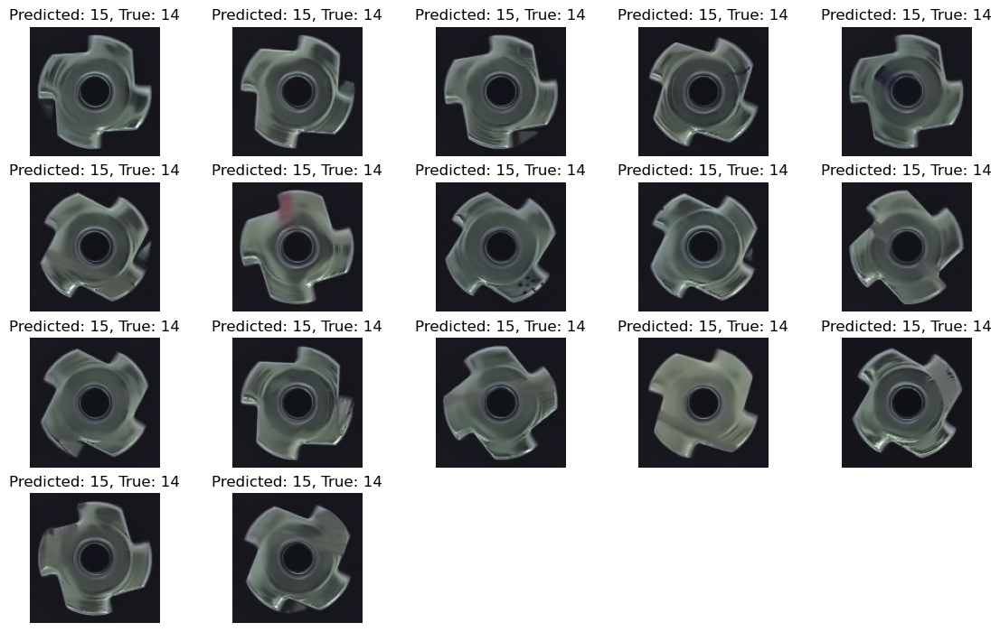

Class 16


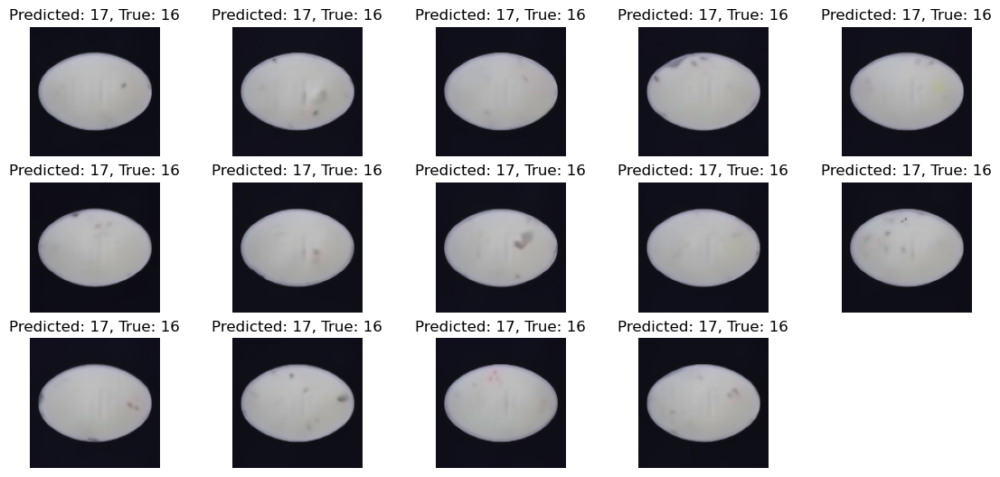

Class 18


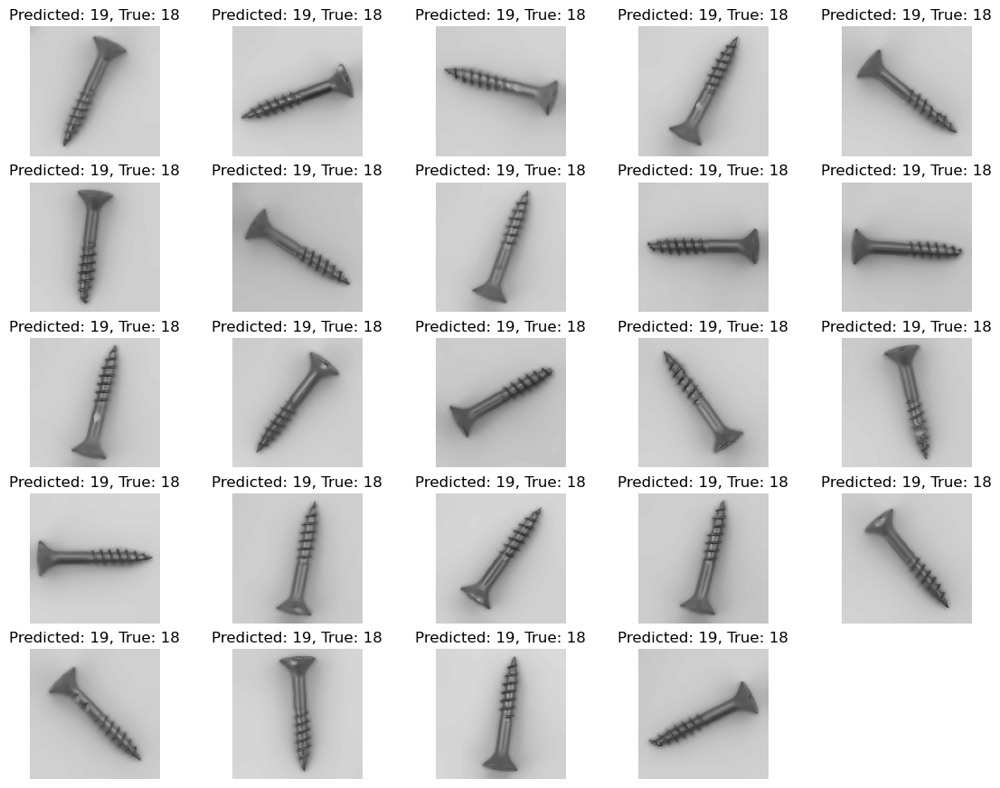

Class 20


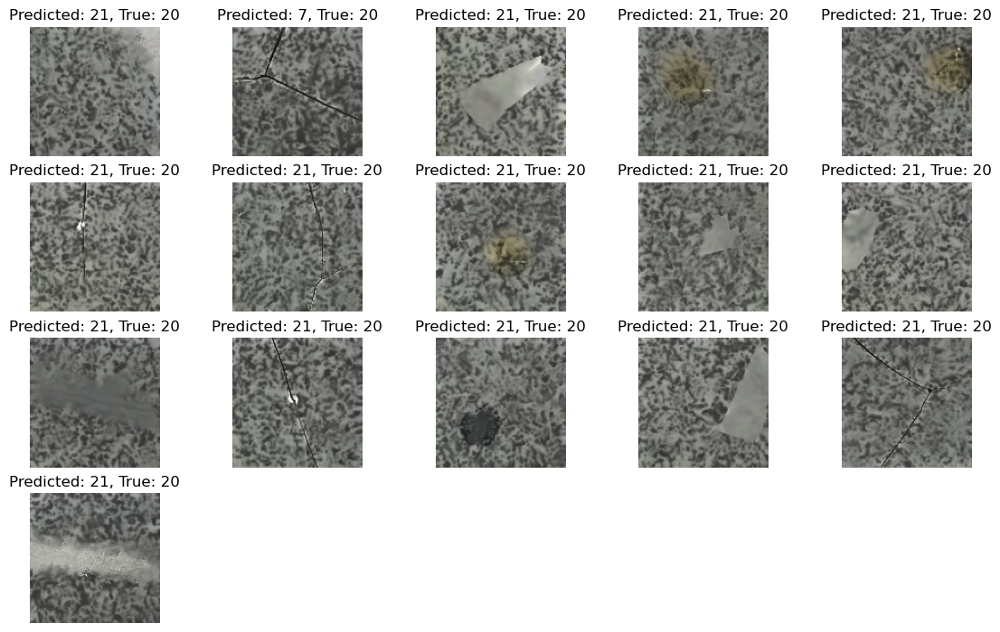

Class 22


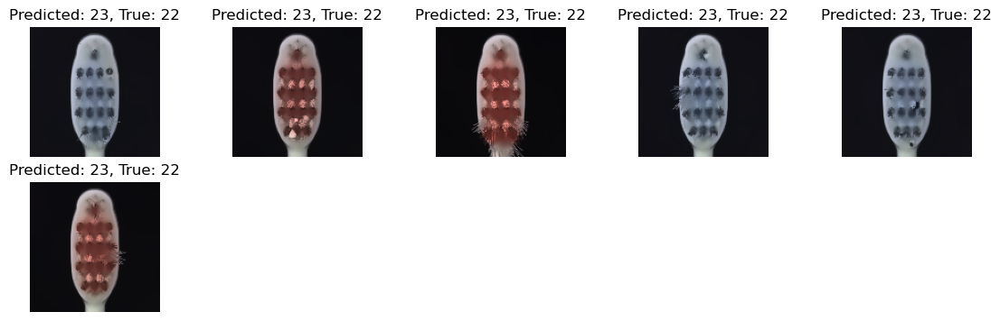

Class 24


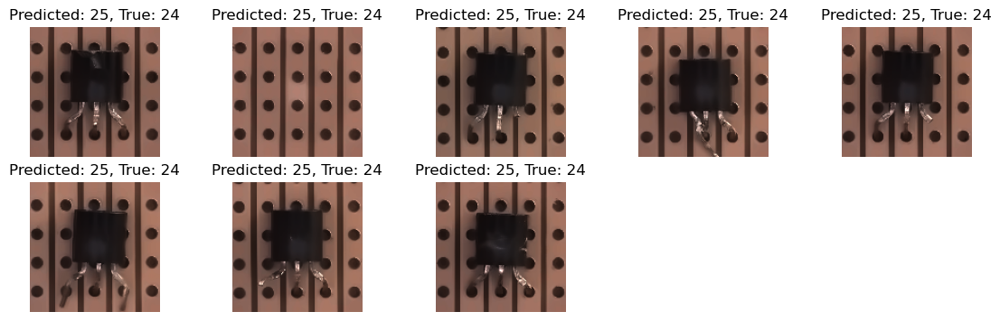

In [30]:
classes=list(report_edge[report_edge['recall']<0.6].index)[:-2]
for i in [int(s.split()[1]) for s in classes]:
    print("Class {}".format(i))
    true_label=i
    misclassified_indices = np.where((y_true_classes == true_label) & (y_pred_classes_edge != true_label))[0]

    # Plot the misclassified images
    plt.figure(figsize=(14,22))
    for i, idx in enumerate(misclassified_indices[:50]):  # Plot up to 50 images
        plt.subplot(10, 5, i + 1)
        plt.imshow(x_test[idx])
        plt.title(f"Predicted: {y_pred_classes_edge[idx]}, True: {y_true_classes[idx]}")
        plt.axis('off')
    plt.show()